<a href="https://colab.research.google.com/github/utkussaglam/NLPandTheWeb/blob/main/hw6kopie.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Using the same pipeline as for HW5

Just execute everything in this block till Aim UI section

In [ ]:
!pip install -q datasets matplotlib nltk aim

In [ ]:
from datasets import load_dataset

dataset = load_dataset(
    "davidstap/biblenlp-corpus-mmteb", "eng-deu", trust_remote_code=True
)

In [ ]:
dataset['train'][0]

{'eng': 'The grace of the Lord Jesus Christ be with all the saints. Amen.',
 'deu': 'Die Gnade des Herrn Jesus Christus sei mit allen Heiligen!'}

Simple preprocessing (convert text to lowercase and remove punctuation) and word-level tokenization

In [ ]:
import re
from collections import Counter
import torch
from torch.nn.utils.rnn import pad_sequence


class Preprocessor:
    def __init__(self) -> None:
        self.vocab: Counter = Counter()
        self.token_to_id = {}
        self.id_to_token = {}
        self.pad_token_id = 0
        self.unk_token_id = 1
        self.bos_token_id = 2

    def preprocess(self, text: str) -> str:
        # Convert text to lowercase and remove punctuation
        text = text.lower()
        text = re.sub(r'[^\w\s]', '', text)
        return text

    def tokenizer(self, text: str) -> list[str]:
        # Split text into words
        return text.split()

    def update_vocab(self, text: str) -> None:
        # Update vocabulary with a list of texts
        words = self.tokenizer(self.preprocess(text))
        self.vocab.update(words)

    def build_vocab_to_id(self):
        # Create vocab to id and id to vocab mappings
        self.token_to_id = {'<pad>': self.pad_token_id, '<unk>': self.unk_token_id, '<BOS>': self.bos_token_id}
        self.id_to_token = {self.pad_token_id: '<pad>', self.unk_token_id: '<unk>', self.bos_token_id: '<BOS>'}
        for idx, token in enumerate(self.vocab, start=3):  # Start enumerating from 3
            self.token_to_id[token] = idx
            self.id_to_token[idx] = token

    def tokens_to_ids(self, tokens: list[str]) -> list[int]:
        # Convert tokens to ids, using <unk> if the word is not in the vocabulary
        return [
            self.token_to_id.get(token, self.unk_token_id) for token in tokens
        ]

    def tokenize_and_pad(self, texts: list[str], max_length: int) -> torch.Tensor:
        # Tokenize, convert to IDs, and pad the sequences
        tokenized_texts = [
            self.tokens_to_ids(self.tokenizer(self.preprocess(text))) for text in texts
        ]
        padded_texts = pad_sequence(
            [torch.tensor(text[:max_length]) for text in tokenized_texts],
            batch_first=True,
            padding_value=self.pad_token_id,
        )
        return padded_texts

In [ ]:
import os
import pickle
from tqdm import tqdm

preprocessor = Preprocessor()


# simple caching for the preprocessor object
if os.path.exists('./preprocessor.pkl'):
    with open('./preprocessor.pkl', 'rb') as file:
        preprocessor = pickle.load(file)
else:
    # Combine the English and German texts
    # Build the vocabulary
    for i, sample in enumerate(tqdm(dataset['train'], total=len(dataset['train']))):
        preprocessor.update_vocab(sample["eng"])
        preprocessor.update_vocab(sample["deu"])
    # build the token to id and id to token dicts
    preprocessor.build_vocab_to_id()

    with open('./preprocessor.pkl', 'wb') as file:
        pickle.dump(preprocessor, file)

In [ ]:
# Display the vocabulary
print(f"The most common 10 tokens: {preprocessor.vocab.most_common(10)}")  # Show the 10 most common words
print(f"Vocab size: {len(preprocessor.token_to_id)}")

The most common 10 tokens: [('the', 51028), ('und', 36477), ('of', 28928), ('and', 28295), ('to', 19570), ('in', 19513), ('der', 17647), ('die', 16236), ('you', 13401), ('will', 10041)]
Vocab size: 40514


Use the source-code in the PS10 to get started.


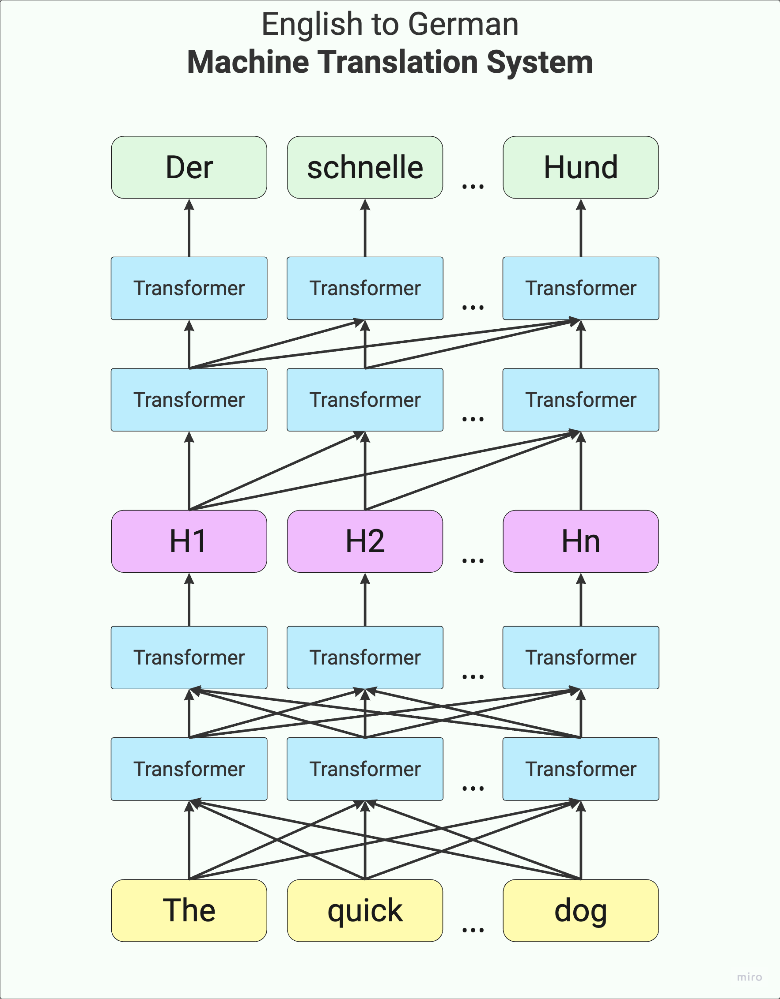

In [ ]:
from datasets import load_dataset
from torch.utils.data import DataLoader
from torch.nn.utils.rnn import pad_sequence


def get_data_loaders(batch_size, block_size):
    def collate_fn(batch):
        src_texts = [item['eng'] for item in batch]
        trg_texts = [item['deu'] for item in batch]

        src_batch = preprocessor.tokenize_and_pad(src_texts, block_size)
        trg_batch = preprocessor.tokenize_and_pad(trg_texts, block_size)
        bos_tokens = torch.full((trg_batch.shape[0], 1), preprocessor.bos_token_id, dtype=torch.long)
        trg_batch = torch.cat([bos_tokens, trg_batch[:, : -1]], dim=1)

        return src_batch, trg_batch

    # DataLoader
    train_loader = DataLoader(
        dataset['train'], batch_size=batch_size, shuffle=True, collate_fn=collate_fn
    )
    val_loader = DataLoader(
        dataset['validation'],
        batch_size=batch_size,
        shuffle=False,
        collate_fn=collate_fn,
    )

    return train_loader, val_loader

In [ ]:
import math
import numpy
import torch
import torch.nn as nn
import matplotlib.pyplot as plt


class PositionalEncoding(nn.Module):
    def __init__(self, n_emb, max_len=5000):
        super().__init__()
        self.n_emb = n_emb
        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, n_emb, 2) * -(math.log(10000.0) / n_emb))
        pe = torch.zeros(max_len, n_emb)
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe)

    def forward(self, T):
        return self.pe[:T, :].detach()


class FeedFoward(nn.Module):
    def __init__(self, n_embd, dropout):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(n_embd, 4 * n_embd),
            nn.ReLU(),
            nn.Linear(4 * n_embd, n_embd),
            nn.Dropout(dropout),
        )

    def forward(self, x):
        return self.net(x)


class BidirectionalContextAttentionHead(nn.Module):
    def __init__(self, head_size, n_embd, dropout):
        super().__init__()
        self.n_embd = n_embd
        self.head_size = head_size
        self.dropout = dropout

        self.key = nn.Linear(self.n_embd, self.head_size, bias=False)
        self.query = nn.Linear(self.n_embd, self.head_size, bias=False)
        self.value = nn.Linear(self.n_embd, self.head_size, bias=False)

        self.dropout_layer = nn.Dropout(self.dropout)

    def forward(self, x):
        B, T, E = x.shape

        k = self.key(x)  # (B, T, E)
        q = self.query(x)  # (B, T, E)

        # compute attention scores ("affinities")
        wei = q @ k.transpose(-2, -1) * self.head_size**-0.5  # (B, T, T)
        wei = F.softmax(
            wei, dim=-1
        )  # (B, T, T)  # softmax over the last dimension to create attention weights
        wei = self.dropout_layer(wei)

        # perform the weighted aggregation of the values
        v = self.value(x)  # (B, T, E)
        out = wei @ v  # (B, T, T) @ (B, T, E) -> (B, T, E)

        return out


class BidirectionalContextMultiHeadAttention(nn.Module):
    def __init__(self, n_head, head_size, n_embd, dropout):
        super().__init__()
        self.n_head = n_head
        self.head_size = head_size
        self.n_embd = n_embd
        self.dropout = dropout

        self.heads = nn.ModuleList(
            [
                BidirectionalContextAttentionHead(
                    self.head_size, self.n_embd, self.dropout
                )
                for _ in range(self.n_head)
            ]
        )
        self.proj = nn.Linear(self.n_embd, self.n_embd)
        self.dropout_layer = nn.Dropout(self.dropout)

    def forward(self, x):
        out = torch.cat([h(x) for h in self.heads], dim=-1)
        out = self.dropout_layer(self.proj(out))
        return out


class EncoderBlock(nn.Module):
    def __init__(self, n_embd, n_head, dropout):
        super().__init__()
        self.n_embd = n_embd
        self.n_head = n_head
        self.dropout = dropout

        head_size = self.n_embd // self.n_head
        self.sa = BidirectionalContextMultiHeadAttention(
            self.n_head, head_size, self.n_embd, self.dropout
        )
        self.ffwd = FeedFoward(self.n_embd, self.dropout)
        self.ln1 = nn.LayerNorm(self.n_embd)
        self.ln2 = nn.LayerNorm(self.n_embd)

    def forward(self, x):
        x = x + self.sa(self.ln1(x))
        x = x + self.ffwd(self.ln2(x))
        return x


class UnidirectionalContextAttentionHead(nn.Module):
    def __init__(self, head_size, n_embd, block_size, dropout):
        super().__init__()
        self.head_size = head_size
        self.n_embd = n_embd
        self.block_size = block_size
        self.dropout = dropout

        self.key = nn.Linear(self.n_embd, self.head_size, bias=False)
        self.query = nn.Linear(self.n_embd, self.head_size, bias=False)
        self.value = nn.Linear(self.n_embd, self.head_size, bias=False)

        self.dropout_layer = nn.Dropout(self.dropout)

    def forward(self, x):
        B, T, E = x.shape
        tril_mask = torch.tril(torch.ones((T, T), device=x.device)).bool()

        k = self.key(x)  # (B, T, E)
        q = self.query(x)  # (B, T, E)

        # compute attention scores ("affinities")
        wei = q @ k.transpose(-2, -1) * E**-0.5  # (B, T, E) @ (B, E, T) -> (B, T, T)

        # todo - experimental
        wei = wei.masked_fill(~tril_mask, float('-inf'))
        # wei = wei.masked_fill(self.tril[:T, :T] == 0, float('-inf'))  # (B, T, T)

        wei = F.softmax(wei, dim=-1)  # (B, T, T)
        wei = self.dropout_layer(wei)

        # perform the weighted aggregation of the values
        v = self.value(x)  # (B, T, E)
        out = wei @ v  # (B, T, T) @ (B, T, E) -> (B, T, E)

        return out


class UnidirectionalContextMultiHeadAttention(nn.Module):
    def __init__(self, n_head, head_size, n_embd, block_size, dropout):
        super().__init__()
        self.n_head = n_head
        self.head_size = head_size
        self.n_embd = n_embd
        self.block_size = block_size
        self.dropout = dropout

        self.heads = nn.ModuleList(
            [
                UnidirectionalContextAttentionHead(
                    self.head_size, self.n_embd, self.block_size, self.dropout
                )
                for _ in range(self.n_head)
            ]
        )
        self.proj = nn.Linear(self.n_embd, self.n_embd)
        self.dropout_layer = nn.Dropout(self.dropout)

    def forward(self, x):
        out = torch.cat([h(x) for h in self.heads], dim=-1)
        out = self.dropout_layer(self.proj(out))
        return out


class CrossAttentionBidirectionalAttentionHead(nn.Module):
    def __init__(self, head_size, n_embd, dropout):
        super().__init__()
        self.n_embd = n_embd
        self.head_size = head_size
        self.dropout = dropout

        self.key = nn.Linear(self.n_embd, self.head_size, bias=False)
        self.query = nn.Linear(self.n_embd, self.head_size, bias=False)
        self.value = nn.Linear(self.n_embd, self.head_size, bias=False)

        self.dropout_layer = nn.Dropout(self.dropout)

    def forward(self, x, context):
        B, T, E = x.shape

        k = self.key(context)  # (B, T, E)
        q = self.query(x)  # (B, T, E)

        # compute attention scores ("affinities")
        wei = q @ k.transpose(-2, -1) * self.head_size**-0.5  # (B, T, T)
        wei = F.softmax(
            wei, dim=-1
        )  # (B, T, T)  # softmax over the last dimension to create attention weights
        wei = self.dropout_layer(wei)

        # perform the weighted aggregation of the values
        v = self.value(context)  # (B, T, E)
        out = wei @ v  # (B, T, T) @ (B, T, E) -> (B, T, E)

        return out


class CrossAttentionMultiHead(nn.Module):
    def __init__(self, n_head, head_size, n_embd, dropout):
        super().__init__()
        self.n_head = n_head
        self.head_size = head_size
        self.n_embd = n_embd
        self.dropout = dropout

        # Instantiate multiple heads for cross-attention
        self.heads = nn.ModuleList(
            [
                CrossAttentionBidirectionalAttentionHead(
                    self.head_size, self.n_embd, self.dropout
                )
                for _ in range(self.n_head)
            ]
        )
        self.proj = nn.Linear(self.n_embd, self.n_embd)
        self.dropout_layer = nn.Dropout(self.dropout)

    def forward(self, x, context):
        out = torch.cat([h(x, context) for h in self.heads], dim=-1)
        out = self.dropout_layer(self.proj(out))
        return out


class DecoderBlock(nn.Module):
    def __init__(self, n_embd, n_head, block_size, dropout):
        super().__init__()
        self.n_embd = n_embd
        self.n_head = n_head
        self.block_size = block_size
        self.dropout = dropout

        head_size = self.n_embd // self.n_head
        self.masked_sa = UnidirectionalContextMultiHeadAttention(
            self.n_head, head_size, self.n_embd, self.block_size, self.dropout
        )
        self.cross_attn = CrossAttentionMultiHead(
            self.n_head, head_size, self.n_embd, self.dropout
        )

        self.ffwd = FeedFoward(self.n_embd, self.dropout)
        self.ln1 = nn.LayerNorm(self.n_embd)
        self.ln2 = nn.LayerNorm(self.n_embd)
        self.ln3 = nn.LayerNorm(self.n_embd)

    def forward(self, x, context):
        x = self.ln1(x + self.masked_sa(x))
        x = self.ln2(x + self.cross_attn(x, context))
        x = self.ln3(x + self.ffwd(x))
        return x


class NMT(nn.Module):
    def __init__(self, vocab_size, n_embd, n_head, n_layer, block_size, dropout):
        super().__init__()
        self.vocab_size = vocab_size
        self.n_embd = n_embd
        self.n_head = n_head
        self.n_layer = n_layer
        self.block_size = block_size
        self.dropout = dropout

        self.shared_embedding = nn.Embedding(self.vocab_size, self.n_embd)
        self.position_embedding_table = PositionalEncoding(self.n_embd)

        self.encoder_blocks = nn.ModuleList(
            [
                EncoderBlock(self.n_embd, self.n_head, self.dropout)
                for _ in range(self.n_layer)
            ]
        )
        self.decoder_blocks = nn.ModuleList(
            [
                DecoderBlock(self.n_embd, self.n_head, self.block_size, self.dropout)
                for _ in range(self.n_layer)
            ]
        )

        self.ln_f = nn.LayerNorm(self.n_embd)
        self.output_layer = nn.Linear(self.n_embd, self.vocab_size)

    def forward(self, input_ids, target_ids):
        B, T = input_ids.shape

        tok_emb = self.shared_embedding(input_ids)
        pos_emb = self.position_embedding_table(input_ids.shape[-1])  # (T,E)
        encoder_output = tok_emb + pos_emb  # (B, T, E)

        # Encode
        for block in self.encoder_blocks:
            encoder_output = block(encoder_output)

        # Decode
        tok_emb = self.shared_embedding(target_ids)
        pos_emb = self.position_embedding_table(target_ids.shape[-1])  # (T, E)
        decoder_output = tok_emb + pos_emb  # (B, T, E)

        for block in self.decoder_blocks:
            decoder_output = block(decoder_output, encoder_output)

        # Output
        logits = self.output_layer(self.ln_f(decoder_output))

        return logits


# Aim UI

In [ ]:
%load_ext aim
!aim init
%aim up

The aim extension is already loaded. To reload it, use:
  %reload_ext aim
Aim repository is already initialized. Do you want to re-initialize to empty Aim repository? [y/N]: N


<IPython.core.display.Javascript object>

# TASK1: Integrate Aim (experiment tracking tool) in the training loop (5 points)

 **Log**:
  - hparams
  - number of parameters in the model
  - the optimizer name

**Track**:
  - trainig loss
  - validation loss
  - validation BLEU score
  - sample generations on validation set

In [ ]:
import torch.optim as optim

hparams = {
    "vocab_size": len(preprocessor.token_to_id),
    "batch_size": 32,
    "block_size": 32,
    "max_iters": 5000,
    "eval_interval": 100,
    "learning_rate": 1e-3,
    "num_epochs": 1,
    "device": 'cuda' if torch.cuda.is_available() else 'cpu',
    "eval_iters": 200,
    "n_embd": 64,
    "n_head": 4,
    "n_layer": 8,
    "dropout": 0.1,
    "seed": 1337,
}


# Initialize and run a simple test
model = NMT(
    vocab_size=hparams["vocab_size"],
    n_embd=hparams["n_embd"],
    n_head=hparams["n_head"],
    n_layer=hparams["n_layer"],
    block_size=hparams["block_size"],
    dropout=hparams["dropout"],
)
model = model.to(hparams["device"])
# print the number of parameters in the model
num_model_params = sum(p.numel() for p in model.parameters()) / 1e6
print(num_model_params, 'M parameters')


# Optimizer and loss
optimizer = optim.Adam(model.parameters(), lr=hparams["learning_rate"])
loss_fn = nn.CrossEntropyLoss(
    ignore_index=preprocessor.pad_token_id
)  # Assuming 0 is the pad token index

6.155714 M parameters


In [ ]:
## YOUR_CODE_STARTS_HERE
from aim import Run
run = Run()
run["hparams"] = hparams


## YOUR_CODE_ENDS_HERE

In [ ]:
import torch
import torch.nn as nn
from torch.nn import functional as F
import random
from os.path import exists
from aim import Text

from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction


def evaluate(model, loader, loss_fn):
    model.eval()
    total_loss = 0
    references = []
    hypotheses = []

    with torch.no_grad():
        for src_batch, trg_batch in tqdm(loader, desc="Evaluating", position=0, leave=True):
            src_batch, trg_batch = src_batch.to(hparams['device']), trg_batch.to(hparams['device'])

            outputs = model(src_batch, trg_batch)
            loss = loss_fn(outputs.view(-1, outputs.size(-1)), trg_batch.view(-1))
            total_loss += loss.item()

            output_sequences = outputs.argmax(dim=-1)
            for i in range(output_sequences.size(0)):
                ref = [
                    preprocessor.id_to_token[word.item()]
                    for word in trg_batch[i].cpu()
                    if word != preprocessor.pad_token_id
                ]
                hyp = [
                    preprocessor.id_to_token[word.item()]
                    for word in output_sequences[i].cpu()
                    if word != preprocessor.pad_token_id
                ]

                references.append([ref])  # BLEU expects a list of references
                hypotheses.append(hyp)

    bleu_score = corpus_bleu(references, hypotheses, smoothing_function=SmoothingFunction().method1)
    return total_loss / len(loader), bleu_score, hypotheses[:5]


# Training function with evaluation calls
def train_and_evaluate(model, train_loader, val_loader, optimizer, loss_fn, eval_interval):
    model.train()
    total_loss = 0
    for idx, (src_batch, trg_batch) in enumerate(tqdm(train_loader, desc="Training", leave=True)):
        src_batch, trg_batch = src_batch.to(hparams["device"]), trg_batch.to(hparams["device"])

        optimizer.zero_grad()
        output = model(src_batch, trg_batch)
        loss = loss_fn(output.view(-1, output.size(-1)), trg_batch.view(-1))
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        # Evaluate every eval_interval iterations
        if (idx + 1) % eval_interval == 0:
            val_loss, val_bleu_score, eval_sample_generations = evaluate(
                model, val_loader, loss_fn
            )
            print(f"\nIteration {idx + 1}:\n     Train Loss = {loss.item():.4f}, Val Loss = {val_loss:.4f}, Val BLEU = {val_bleu_score:.4f}\n")
            print(f"\nSample generation: '{' '.join(eval_sample_generations[0])}'\n")

            ## YOUR_CODE_STARTS_HERE
            run.track(val_loss, name='val_loss_score', step=idx, context={"subset": "val"})
            run.track(val_bleu_score, name='val_bleu_score', step=idx, context={"subset": "val"})
            ## YOUR_CODE_ENDS_HERE

            for eval_sample_generation in eval_sample_generations:
                ## YOUR_CODE_STARTS_HERE
                run.track(Text(" ".join(eval_sample_generation)),name = "example_generation", step=idx)
                ## YOUR_CODE_ENDS_HERE

            model.train()
            # Save the model
            os.makedirs("ckpts", exist_ok=True)
            torch.save(model.state_dict(), f"./ckpts/translation_model_{idx}.pth")

    return total_loss / len(train_loader)


train_loader, val_loader = get_data_loaders(hparams["batch_size"], hparams["block_size"])

# Training loop
for epoch in range(hparams["num_epochs"]):
    epoch_loss = train_and_evaluate(model, train_loader, val_loader, optimizer, loss_fn, hparams['eval_interval'])
    print(f"Epoch {epoch+1}/{hparams['num_epochs']}, Epoch Loss: {epoch_loss:.4f}")

Training:   3%|▎         | 100/3590 [00:21<2:32:08,  2.62s/it]


Iteration 100:
     Train Loss = 2.3817, Val Loss = 2.5688, Val BLEU = 0.3056


Sample generation: '<BOS> der diese sohnes ihr spricht ja ich er daß da hast herr jesus unter als als als als als jesus jesus jesus jesus unter unter als als als als als jesus'



Training:   6%|▌         | 200/3590 [00:43<2:34:05,  2.73s/it]


Iteration 200:
     Train Loss = 2.7166, Val Loss = 2.5231, Val BLEU = 0.3104


Sample generation: '<BOS> der diese sohnes sprach spricht ja ich er sie da man herr jesus unter aber als als als als jesus jesus jesus jesus unter unter als als als als jesus jesus'



Training:   8%|▊         | 300/3590 [01:05<2:42:53,  2.97s/it]


Iteration 300:
     Train Loss = 2.2341, Val Loss = 2.4775, Val BLEU = 0.3183


Sample generation: '<BOS> der diese sohnes in spricht ja ich er sie da hast herr jesus unter ihr ihr als als als jesus jesus jesus ihr unter unter als als als als jesus jesus'



Training:  11%|█         | 400/3590 [01:26<2:12:17,  2.49s/it]


Iteration 400:
     Train Loss = 2.6042, Val Loss = 2.4390, Val BLEU = 0.3218


Sample generation: '<BOS> der diese sohnes in spricht ja ich er daß da hast herr jesus unter unter als und als als als jesus jesus unter unter unter als als als als als als'



Training:  14%|█▍        | 500/3590 [01:47<2:20:35,  2.73s/it]


Iteration 500:
     Train Loss = 2.2628, Val Loss = 2.4025, Val BLEU = 0.3279


Sample generation: '<BOS> der diese sohnes ihr spricht ja ich er sie da hast herr jesus unter als als als als jesus jesus jesus jesus jesus unter unter als als als jesus jesus jesus'



Training:  17%|█▋        | 600/3590 [02:09<2:14:42,  2.70s/it]


Iteration 600:
     Train Loss = 2.3561, Val Loss = 2.3535, Val BLEU = 0.3341


Sample generation: '<BOS> der diese sohnes in spricht ja ich er daß da man herr jesus als als als als als als als jesus jesus als unter unter als als als als als als'



Training:  19%|█▉        | 700/3590 [02:30<2:02:39,  2.55s/it]


Iteration 700:
     Train Loss = 2.3170, Val Loss = 2.3219, Val BLEU = 0.3391


Sample generation: '<BOS> der diese sohnes sprach spricht ja ich er daß da hast herr jesus seid als als als als als jesus jesus jesus jesus seid seid als als als als jesus jesus'



Training:  22%|██▏       | 800/3590 [02:52<2:05:03,  2.69s/it]


Iteration 800:
     Train Loss = 1.8388, Val Loss = 2.2813, Val BLEU = 0.3442


Sample generation: '<BOS> der diese sohnes sprach spricht ja ich er sei da hast herr jesus seid seid und und nur seid seid jesus seid seid seid seid seid und und seid seid seid'



Training:  25%|██▌       | 900/3590 [03:14<2:06:00,  2.81s/it]


Iteration 900:
     Train Loss = 2.3938, Val Loss = 2.2551, Val BLEU = 0.3481


Sample generation: '<BOS> der diese sohnes in spricht ja ich er sie da hast herr jesus seid und und und und seid jesus jesus jesus und und und und und und und und und'



Training:  28%|██▊       | 1000/3590 [03:35<1:54:08,  2.64s/it]


Iteration 1000:
     Train Loss = 2.5042, Val Loss = 2.2153, Val BLEU = 0.3550


Sample generation: '<BOS> der diese sohnes sprach spricht ja ich er sei da erde herr jesus seid seid seid seid seid seid jesus jesus jesus seid seid seid seid seid jesus jesus jesus jesus'



Training:  31%|███       | 1100/3590 [03:57<1:42:41,  2.47s/it]


Iteration 1100:
     Train Loss = 2.2857, Val Loss = 2.1790, Val BLEU = 0.3624


Sample generation: '<BOS> der diese sohnes ihr spricht ja ich er sei da hast herr jesus seid ihr ihr seid seid seid seid seid ihr ihr seid seid seid seid seid seid seid seid'



Training:  33%|███▎      | 1200/3590 [04:19<1:48:04,  2.71s/it]


Iteration 1200:
     Train Loss = 1.8242, Val Loss = 2.1562, Val BLEU = 0.3656


Sample generation: '<BOS> der diese sohnes sprach spricht ja ich komme sei da hast herr jesus seid ihr ihr seid seid seid seid jesus ihr ihr seid seid seid seid seid seid seid seid'



Training:  36%|███▌      | 1300/3590 [04:41<1:43:13,  2.70s/it]


Iteration 1300:
     Train Loss = 2.0593, Val Loss = 2.1232, Val BLEU = 0.3722


Sample generation: '<BOS> der diese sohnes in spricht ja ich komme sei da hast herr jesus seid seid seid und seid seid seid jesus jesus seid seid seid seid seid seid seid seid seid'



Training:  39%|███▉      | 1400/3590 [05:02<1:30:43,  2.49s/it]


Iteration 1400:
     Train Loss = 1.6780, Val Loss = 2.0951, Val BLEU = 0.3791


Sample generation: '<BOS> der diese sohnes sprach spricht ja ich komme sei da komm herr jesus seid seid und und seid seid seid jesus seid seid seid seid seid seid sünde sünde seid seid'



Training:  42%|████▏     | 1500/3590 [05:23<1:35:23,  2.74s/it]


Iteration 1500:
     Train Loss = 1.5550, Val Loss = 2.0665, Val BLEU = 0.3835


Sample generation: '<BOS> der diese sohnes in spricht ja ich komme sei da komm herr jesus seid seid und und seid seid seid jesus jesus seid seid seid seid seid seid seid seid seid'



Training:  45%|████▍     | 1600/3590 [05:45<1:30:56,  2.74s/it]


Iteration 1600:
     Train Loss = 2.0521, Val Loss = 2.0342, Val BLEU = 0.3918


Sample generation: '<BOS> der diese dinge sprach spricht ja ich komme sei da hast herr jesus seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid'



Training:  47%|████▋     | 1700/3590 [06:06<1:19:36,  2.53s/it]


Iteration 1700:
     Train Loss = 1.9323, Val Loss = 2.0065, Val BLEU = 0.3959


Sample generation: '<BOS> der diese dinge saul spricht ja ich komme sei da komm herr jesus unter unter unter sünde seid seid seid seid seid seid unter unter seid sünde sünde sünde sünde sünde'



Training:  50%|█████     | 1800/3590 [06:29<1:27:25,  2.93s/it]


Iteration 1800:
     Train Loss = 1.7853, Val Loss = 1.9808, Val BLEU = 0.3995


Sample generation: '<BOS> der diese dinge sprach spricht ja ich komme sei da komm herr jesus seid seid seid sünde seid seid seid seid seid seid seid seid seid seid sünde sünde sünde seid'



Training:  53%|█████▎    | 1900/3590 [06:50<1:16:31,  2.72s/it]


Iteration 1900:
     Train Loss = 1.4402, Val Loss = 1.9550, Val BLEU = 0.4023


Sample generation: '<BOS> der diese dinge sprach spricht ja ich komme sei da komm herr jesus seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid'



Training:  56%|█████▌    | 2000/3590 [07:11<1:07:47,  2.56s/it]


Iteration 2000:
     Train Loss = 1.2151, Val Loss = 1.9355, Val BLEU = 0.4057


Sample generation: '<BOS> der diese dinge saul spricht ja ich komme sei da komm herr jesus seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid seid'



Training:  58%|█████▊    | 2100/3590 [07:33<1:05:51,  2.65s/it]


Iteration 2100:
     Train Loss = 2.0530, Val Loss = 1.9053, Val BLEU = 0.4131


Sample generation: '<BOS> der diese dinge saul spricht ja ich komme sei da komm herr jesus seid seid sünde sünde sünde seid seid seid sünde sünde sünde unter sünde sünde sünde sünde sünde sünde'



Training:  61%|██████▏   | 2200/3590 [07:55<1:03:42,  2.75s/it]


Iteration 2200:
     Train Loss = 2.3405, Val Loss = 1.8797, Val BLEU = 0.4178


Sample generation: '<BOS> der diese dinge saul spricht ja ich komme sei da komm herr jesus seid seid seid sünde seid seid seid seid seid seid seid seid seid sünde sünde sünde sünde seid'



Training:  64%|██████▍   | 2300/3590 [08:17<58:26,  2.72s/it]


Iteration 2300:
     Train Loss = 1.7332, Val Loss = 1.8626, Val BLEU = 0.4205


Sample generation: '<BOS> der diese dinge sagen spricht ja ich komme sei da komm herr jesus seid seid seid seid seid seid seid seid seid seid seid seid seid seid sünde sünde seid seid'



Training:  67%|██████▋   | 2400/3590 [08:37<49:19,  2.49s/it]


Iteration 2400:
     Train Loss = 1.6096, Val Loss = 1.8422, Val BLEU = 0.4226


Sample generation: '<BOS> der diese dinge saul spricht ja ich komme sei da komm herr jesus seid seid sünde sünde seid seid seid seid seid seid seid seid seid sünde sünde sünde sünde seid'



Training:  70%|██████▉   | 2500/3590 [09:00<56:53,  3.13s/it]


Iteration 2500:
     Train Loss = 1.7869, Val Loss = 1.8169, Val BLEU = 0.4293


Sample generation: '<BOS> der diese dinge saul spricht ja ich komme sei da komm herr jesus seid seid sünde sünde sünde seid seid seid sünde sünde seid seid seid sünde sünde sünde sünde seid'



Training:  72%|███████▏  | 2600/3590 [09:22<45:29,  2.76s/it]


Iteration 2600:
     Train Loss = 1.6699, Val Loss = 1.7971, Val BLEU = 0.4298


Sample generation: '<BOS> der diese dinge sagen spricht ja ich komme sei da komm herr jesus seid seid sünde sünde sünde seid seid seid sünde sünde sünde seid seid sünde sünde sünde sünde sünde'



Training:  75%|███████▌  | 2700/3590 [09:43<36:28,  2.46s/it]


Iteration 2700:
     Train Loss = 1.6799, Val Loss = 1.7779, Val BLEU = 0.4352


Sample generation: '<BOS> der diese dinge saul spricht ja ich komme sei da komm herr jesus seid seid sünde sünde seid seid seid seid seid seid seid seid seid seid sünde sünde seid seid'



Training:  78%|███████▊  | 2800/3590 [10:05<35:31,  2.70s/it]


Iteration 2800:
     Train Loss = 1.9171, Val Loss = 1.7593, Val BLEU = 0.4392


Sample generation: '<BOS> der diese dinge saul spricht ja ich komme sei da komm herr jesus seid sünde sünde sünde sünde seid seid seid sünde sünde sünde sünde sünde sünde sünde sünde sünde sünde'



Training:  81%|████████  | 2900/3590 [10:26<31:28,  2.74s/it]


Iteration 2900:
     Train Loss = 1.7285, Val Loss = 1.7308, Val BLEU = 0.4425


Sample generation: '<BOS> der diese dinge groß spricht ja ich komme sei da komm herr jesus seid seid sünde sünde sünde seid seid seid sünde sünde sünde sünde sünde sünde sünde sünde sünde sünde'



Training:  84%|████████▎ | 3000/3590 [10:48<25:43,  2.62s/it]


Iteration 3000:
     Train Loss = 1.8248, Val Loss = 1.7172, Val BLEU = 0.4453


Sample generation: '<BOS> der diese dinge groß spricht ja ich komme sei da komm herr jesus seid seid sünde sünde sünde seid seid seid sünde sünde sünde seid sünde sünde sünde sünde sünde sünde'



Training:  86%|████████▋ | 3100/3590 [11:09<21:24,  2.62s/it]


Iteration 3100:
     Train Loss = 1.5984, Val Loss = 1.6930, Val BLEU = 0.4521


Sample generation: '<BOS> der diese dinge groß spricht ja ich komme sei da komm herr jesus seid seid sünde sünde sünde seid seid seid sünde sünde sünde seid seid sünde sünde sünde sünde seid'



Training:  89%|████████▉ | 3200/3590 [11:31<17:46,  2.74s/it]


Iteration 3200:
     Train Loss = 2.0770, Val Loss = 1.6730, Val BLEU = 0.4563


Sample generation: '<BOS> der diese dinge groß spricht ja ich komme sei da komm herr jesus seid fleisch sünde sünde sünde seid seid sünde sünde sünde sünde sünde sünde sünde sünde sünde sünde sünde'



Training:  92%|█████████▏| 3300/3590 [11:53<12:33,  2.60s/it]


Iteration 3300:
     Train Loss = 1.4677, Val Loss = 1.6544, Val BLEU = 0.4587


Sample generation: '<BOS> der diese dinge groß spricht ja ich komme sei da komm herr jesus seid seid sünde sünde sünde seid seid seid sünde sünde sünde seid sünde sünde sünde sünde sünde sünde'



Training:  95%|█████████▍| 3401/3590 [12:15<05:53,  1.87s/it]


Iteration 3400:
     Train Loss = 1.4768, Val Loss = 1.6369, Val BLEU = 0.4605


Sample generation: '<BOS> der diese dinge groß spricht ja ich komme sei da komm herr jesus seid fleisch sünde sünde sünde seid seid seid sünde sünde sünde fest sünde sünde sünde sünde sünde sünde'



Training:  98%|█████████▊| 3501/3590 [12:36<02:51,  1.92s/it]


Iteration 3500:
     Train Loss = 1.8858, Val Loss = 1.6210, Val BLEU = 0.4663


Sample generation: '<BOS> der diese dinge groß spricht ja ich komme sei da komm herr jesus seid seid sünde sünde sünde seid seid seid sünde sünde fest fest fest sünde sünde sünde sünde sünde'



Training: 100%|██████████| 3590/3590 [12:48<00:00,  4.67it/s]

Epoch 1/1, Epoch Loss: 1.9809


# TASK2: Run the experiment in Task1 with varying *batch sizes* and *learning rates*, and analyze their impact on loss and BLEU scores. Write the report in a single text cell in the end (15 points)

In [ ]:
## YOUR_CODE_STARTS_HERE
import torch.optim as optim
import torch.nn as nn
import gc


# batch sizes and learning rates
batch_sizes = [8, 16, 32]
learning_rates = [1e-4, 1e-3, 1e-2]

for batch_size in batch_sizes:
    for learning_rate in learning_rates:
        hparams["batch_size"] = batch_size
        hparams["learning_rate"] = learning_rate

        # Initialize model
        model = NMT(
            vocab_size=hparams["vocab_size"],
            n_embd=hparams["n_embd"],
            n_head=hparams["n_head"],
            n_layer=hparams["n_layer"],
            block_size=hparams["block_size"],
            dropout=hparams["dropout"],
        )
        model = model.to(hparams["device"])

        # Optimizer and loss
        optimizer = optim.Adam(model.parameters(), lr=hparams["learning_rate"])
        loss_fn = nn.CrossEntropyLoss(
            ignore_index=preprocessor.pad_token_id
        )

        # model info
        print(f"Batch Size: {batch_size}, Learning Rate: {learning_rate}")

        # Evaluate and train
        train_loader, val_loader = get_data_loaders(hparams["batch_size"], hparams["block_size"])

        run = Run(experiment=f"batchsize_{batch_size}learningrate{learning_rate}") #create a new Run
        run["hparams"] = hparams

        for epoch in range(hparams["num_epochs"]):
            epoch_loss = train_and_evaluate(model, train_loader, val_loader, optimizer, loss_fn, hparams['eval_interval'])
            print(f"Epoch {epoch+1}/{hparams['num_epochs']}, Epoch Loss: {epoch_loss:.4f}")

## YOUR_CODE_ENDS_HERE

Batch Size: 8, Learning Rate: 0.0001


Evaluating: 100%|██████████| 197/197 [00:08<00:00, 24.01it/s]



Iteration 100:
     Train Loss = 9.4422, Val Loss = 9.3070, Val BLEU = 0.0013


Sample generation: '<BOS> <BOS> belagerungswall und und und der und jeder und find und der und und und und und und und und und und und und wir wir wir und und und und'



Training:   6%|▌         | 200/3590 [00:45<2:35:08,  2.75s/it]


Iteration 200:
     Train Loss = 8.5336, Val Loss = 8.3526, Val BLEU = 0.0354


Sample generation: '<BOS> der den und er und er ich jeder und um von der und wir wir wir wir wir wir wir und und wir wir wir wir wir wir wir wir wir'



Training:   8%|▊         | 300/3590 [01:07<2:30:13,  2.74s/it]


Iteration 300:
     Train Loss = 7.7391, Val Loss = 7.5761, Val BLEU = 0.0498


Sample generation: '<BOS> der den und er und er ich so und <BOS> von der und wir wir wir wir wir und und und und und und wir wir wir wir wir und und'



Training:  11%|█         | 400/3590 [01:28<2:12:10,  2.49s/it]


Iteration 400:
     Train Loss = 6.8408, Val Loss = 6.8959, Val BLEU = 0.0582


Sample generation: '<BOS> der den und er ich er ich der und <BOS> und herr und und wir wir wir wir und und und und und wir wir wir wir wir wir wir und'



Training:  14%|█▍        | 500/3590 [01:50<2:21:45,  2.75s/it]


Iteration 500:
     Train Loss = 6.3372, Val Loss = 6.3117, Val BLEU = 0.0702


Sample generation: '<BOS> der den und er ich er ich der und <BOS> <BOS> herr und und und des des des des und und und und und wir wir denn denn des und und'



Training:  17%|█▋        | 600/3590 [02:12<2:16:46,  2.74s/it]


Iteration 600:
     Train Loss = 5.8343, Val Loss = 5.8041, Val BLEU = 0.0788


Sample generation: '<BOS> der den und er ich er ich der und <BOS> <BOS> herr und und des des des des des des und und und wir wir wir des des des des und'



Training:  19%|█▉        | 700/3590 [02:33<2:04:33,  2.59s/it]


Iteration 700:
     Train Loss = 5.2457, Val Loss = 5.3738, Val BLEU = 0.0904


Sample generation: '<BOS> der den und er ihnen er ich der und <BOS> so herr und des des des des des des des des des des des des des des des des des des'



Training:  22%|██▏       | 800/3590 [02:55<2:04:45,  2.68s/it]


Iteration 800:
     Train Loss = 5.2044, Val Loss = 5.0089, Val BLEU = 0.1063


Sample generation: '<BOS> der den im er ihnen er ich der und so so herr der des des des des des des des des des des des des des des des des des des'



Training:  25%|██▌       | 900/3590 [03:18<2:03:13,  2.75s/it]


Iteration 900:
     Train Loss = 4.6625, Val Loss = 4.6970, Val BLEU = 0.1149


Sample generation: '<BOS> der den im er ihnen er ich der und so so herr der des des des des des des des des des des des des des des des des des des'



Training:  28%|██▊       | 1000/3590 [03:40<1:59:54,  2.78s/it]


Iteration 1000:
     Train Loss = 4.7400, Val Loss = 4.4410, Val BLEU = 0.1219


Sample generation: '<BOS> der den im er ihnen er ich der und so so herr der des des des des des des des des des des des des des des des des des des'



Training:  31%|███       | 1100/3590 [04:01<1:45:13,  2.54s/it]


Iteration 1100:
     Train Loss = 4.4826, Val Loss = 4.2201, Val BLEU = 0.1364


Sample generation: '<BOS> der den im er ihnen er ich der sein um ihn herr der des des des des des des des des des des des des des des des des des des'



Training:  33%|███▎      | 1200/3590 [04:23<1:51:24,  2.80s/it]


Iteration 1200:
     Train Loss = 4.1392, Val Loss = 4.0303, Val BLEU = 0.1467


Sample generation: '<BOS> der den im er ihnen er ich der sein um ihn herr jesus des des des des des des des des des des des des des des des des des seine'



Training:  36%|███▌      | 1300/3590 [04:45<1:44:02,  2.73s/it]


Iteration 1300:
     Train Loss = 3.9497, Val Loss = 3.8692, Val BLEU = 0.1584


Sample generation: '<BOS> der den im er ihnen er ich der sein um ihn herr jesus des des des des des des des des des des des des des des des des des des'



Training:  39%|███▉      | 1400/3590 [05:06<1:33:54,  2.57s/it]


Iteration 1400:
     Train Loss = 4.0977, Val Loss = 3.7257, Val BLEU = 0.1710


Sample generation: '<BOS> der den im er ihnen er ich der wir um ihn herr jesus des des des des des des des des des des des des des des des des des seine'



Training:  42%|████▏     | 1500/3590 [05:28<1:33:06,  2.67s/it]


Iteration 1500:
     Train Loss = 3.6599, Val Loss = 3.5968, Val BLEU = 0.1871


Sample generation: '<BOS> der diese im er spricht er ich der wir um ihn herr jesus des des des des des des des des des des des des des des des des des seine'



Training:  45%|████▍     | 1600/3590 [05:51<1:32:38,  2.79s/it]


Iteration 1600:
     Train Loss = 4.1344, Val Loss = 3.4814, Val BLEU = 0.1967


Sample generation: '<BOS> der diese im er spricht er ich der wir um ihn herr jesus des des des des des des des des des des des des seine seine des des seine seine'



Training:  47%|████▋     | 1700/3590 [06:13<1:24:22,  2.68s/it]


Iteration 1700:
     Train Loss = 3.3123, Val Loss = 3.3734, Val BLEU = 0.2118


Sample generation: '<BOS> der diese alle er spricht ja ich der wir um ihn herr jesus des des des des des des des des des des des seine seine seine seine seine seine seine'



Training:  50%|█████     | 1800/3590 [06:34<1:15:06,  2.52s/it]


Iteration 1800:
     Train Loss = 3.4509, Val Loss = 3.2806, Val BLEU = 0.2200


Sample generation: '<BOS> der diese alle er spricht ja ich der wir um ihn herr jesus des des des des des des des des vom vom wir wir wir seine des des seine seine'



Training:  53%|█████▎    | 1900/3590 [06:56<1:17:40,  2.76s/it]


Iteration 1900:
     Train Loss = 3.5770, Val Loss = 3.1911, Val BLEU = 0.2293


Sample generation: '<BOS> der diese in er spricht ja ich der wir um ihn herr jesus des des des des des des des des vom wir wir wir wir wir des des vom seine'



Training:  56%|█████▌    | 2000/3590 [07:18<1:14:18,  2.80s/it]


Iteration 2000:
     Train Loss = 3.0106, Val Loss = 3.1093, Val BLEU = 0.2407


Sample generation: '<BOS> der diese alle er spricht ja ich der wir um ihn herr jesus des des des des des des vom vom vom wir wir wir wir vom vom vom vom seine'



Training:  58%|█████▊    | 2100/3590 [07:40<1:01:43,  2.49s/it]


Iteration 2100:
     Train Loss = 3.0430, Val Loss = 3.0307, Val BLEU = 0.2469


Sample generation: '<BOS> der diese alle er spricht ja ich der vom um ihn herr jesus deine deine deine deine vom vom vom vom deine deine deine deine deine deine deine vom sind sind'



Training:  61%|██████▏   | 2200/3590 [08:02<1:04:20,  2.78s/it]


Iteration 2200:
     Train Loss = 2.7500, Val Loss = 2.9585, Val BLEU = 0.2544


Sample generation: '<BOS> der diese alle er spricht ja ich der vom um ihn herr jesus seine seine wir wir über über sind vom deine wir wir wir wir seine seine seine seine seine'



Training:  64%|██████▍   | 2300/3590 [08:25<59:59,  2.79s/it]


Iteration 2300:
     Train Loss = 2.1764, Val Loss = 2.8909, Val BLEU = 0.2609


Sample generation: '<BOS> der diese tage er spricht ja ich der vom so ihn herr jesus deine des des des über über über vom vom wir wir wir wir deine deine vom seine sind'



Training:  67%|██████▋   | 2400/3590 [08:46<54:15,  2.74s/it]


Iteration 2400:
     Train Loss = 3.3939, Val Loss = 2.8193, Val BLEU = 0.2711


Sample generation: '<BOS> der diese alle er spricht ja ich der vom um ihn herr jesus des des wir wir des des sind vom wir wir wir wir wir wir wir sind sind sind'



Training:  70%|██████▉   | 2500/3590 [09:08<45:44,  2.52s/it]


Iteration 2500:
     Train Loss = 2.9478, Val Loss = 2.7615, Val BLEU = 0.2795


Sample generation: '<BOS> der diese tage er spricht ja ich dann vom um ihn herr jesus deine des wir wir des des deine deine deine wir wir wir wir wir deine deine sind sind'



Training:  72%|███████▏  | 2600/3590 [09:30<46:01,  2.79s/it]


Iteration 2600:
     Train Loss = 2.4112, Val Loss = 2.7098, Val BLEU = 0.2870


Sample generation: '<BOS> der diese tage er spricht ja ich dann vom um ihn herr jesus des des des des des des sind sind vom vom wir wir wir deine sind sind sind sind'



Training:  75%|███████▌  | 2700/3590 [09:52<41:04,  2.77s/it]


Iteration 2700:
     Train Loss = 2.5858, Val Loss = 2.6525, Val BLEU = 0.2941


Sample generation: '<BOS> der diese tage er spricht ja ich komme vom ihre ihn herr jesus des des des des des des des des des des des wir wir des des des des sind'



Training:  78%|███████▊  | 2800/3590 [10:13<32:50,  2.49s/it]


Iteration 2800:
     Train Loss = 2.3035, Val Loss = 2.5991, Val BLEU = 0.3003


Sample generation: '<BOS> der diese tage er spricht ja ich komme vom ihre ihn herr jesus des des des des des des des deine deine deine wir wir deine deine des des des seine'



Training:  81%|████████  | 2900/3590 [10:36<34:14,  2.98s/it]


Iteration 2900:
     Train Loss = 2.3524, Val Loss = 2.5498, Val BLEU = 0.3063


Sample generation: '<BOS> der diese dinge er spricht ja ich komme vom um ihn herr jesus deine wir wir wir wir deine deine deine deine wir wir wir wir wir wir deine sind sind'



Training:  84%|████████▎ | 3000/3590 [10:58<27:19,  2.78s/it]


Iteration 3000:
     Train Loss = 2.1408, Val Loss = 2.5082, Val BLEU = 0.3125


Sample generation: '<BOS> der diese tage er spricht ja ich komme vom um ihn herr jesus deine wir wir wir wir vom vom vom vom wir wir wir wir wir wir vom vom sind'



Training:  86%|████████▋ | 3100/3590 [11:19<22:13,  2.72s/it]


Iteration 3100:
     Train Loss = 2.1826, Val Loss = 2.4646, Val BLEU = 0.3177


Sample generation: '<BOS> der diese tage er spricht ja ich komme vom hause ihn herr jesus deine wir wir wir wir über über über wir wir wir wir wir wir wir sind sind sind'



Training:  89%|████████▉ | 3200/3590 [11:41<16:24,  2.52s/it]


Iteration 3200:
     Train Loss = 2.4326, Val Loss = 2.4216, Val BLEU = 0.3236


Sample generation: '<BOS> der diese dinge er spricht ja ich komme vom hause ihn herr jesus deine wir wir wir wir deine deine deine deine wir wir wir wir wir vom vom vom sind'



Training:  92%|█████████▏| 3300/3590 [12:02<13:21,  2.76s/it]


Iteration 3300:
     Train Loss = 3.0034, Val Loss = 2.3801, Val BLEU = 0.3294


Sample generation: '<BOS> der diese dinge einem spricht ja ich komme vom hause ihn herr jesus deine wir wir wir wir deine deine deine deine wir wir wir wir wir wir sind sind sind'



Training:  95%|█████████▍| 3400/3590 [12:25<08:46,  2.77s/it]


Iteration 3400:
     Train Loss = 2.5314, Val Loss = 2.3349, Val BLEU = 0.3371


Sample generation: '<BOS> der diese dinge einem spricht ja ich komme vom hause ihn herr jesus des des des des des des des des des des wir wir wir wir des des des sind'



Training:  97%|█████████▋| 3500/3590 [12:46<03:51,  2.57s/it]


Iteration 3500:
     Train Loss = 3.0007, Val Loss = 2.2997, Val BLEU = 0.3445


Sample generation: '<BOS> der diese dinge er spricht ja ich komme vom hause ihn herr jesus deine deine wir wir deine deine deine deine deine deine wir wir wir wir deine ganze deine sind'



Training: 100%|██████████| 3590/3590 [12:58<00:00,  4.61it/s]


Epoch 1/1, Epoch Loss: 4.1189
Batch Size: 8, Learning Rate: 0.001


Training:   3%|▎         | 100/3590 [00:22<2:30:11,  2.58s/it]


Iteration 100:
     Train Loss = 5.5294, Val Loss = 5.5303, Val BLEU = 0.0431


Sample generation: '<BOS> der ich ihr daß und und ich ich <BOS> und und und aber in in in in in in in in der in in in in in der der der der'



Training:   6%|▌         | 200/3590 [00:44<2:33:34,  2.72s/it]


Iteration 200:
     Train Loss = 3.7201, Val Loss = 3.7206, Val BLEU = 0.1763


Sample generation: '<BOS> der so ihr wie spricht ja ich ich dem sich des herr aber aus aus aus in in in in ich ich ich in in aus dem dem dem dem dem'



Training:   8%|▊         | 300/3590 [01:06<2:31:48,  2.77s/it]


Iteration 300:
     Train Loss = 2.7268, Val Loss = 2.9909, Val BLEU = 0.2547


Sample generation: '<BOS> der diese dinge werden spricht ja ich seiner könig sich des herr jesus aus aus aus aus aus aus aus aus aus aus aus aus aus kinder kinder aus aus aus'



Training:  11%|█         | 400/3590 [01:27<2:12:11,  2.49s/it]


Iteration 400:
     Train Loss = 2.3781, Val Loss = 2.5635, Val BLEU = 0.3192


Sample generation: '<BOS> der diese dinge werden spricht ja ich seiner könig sich des herr jesus kinder kinder kinder kinder kinder ich ich ich ich ich kinder kinder kinder kinder ich ich ich dem'



Training:  14%|█▍        | 500/3590 [01:48<2:22:18,  2.76s/it]


Iteration 500:
     Train Loss = 3.0866, Val Loss = 2.2484, Val BLEU = 0.3722


Sample generation: '<BOS> der diese dinge wird spricht ja ich komme könig sich eines herr jesus kinder ruhe ruhe ruhe ruhe ruhe ruhe ruhe warum lassen lassen kinder kinder kinder kinder aus aus aus'



Training:  17%|█▋        | 600/3590 [02:10<2:14:59,  2.71s/it]


Iteration 600:
     Train Loss = 2.1554, Val Loss = 2.0005, Val BLEU = 0.4096


Sample generation: '<BOS> der diese dinge werden spricht ja ich komme könig sich eines herr jesus kinder kinder kinder kinder kinder warum warum warum warum wollten wollten kinder kinder kinder kinder warum warum kinder'



Training:  19%|█▉        | 700/3590 [02:31<2:01:28,  2.52s/it]


Iteration 700:
     Train Loss = 1.6385, Val Loss = 1.8111, Val BLEU = 0.4353


Sample generation: '<BOS> der diese dinge werden spricht ja ich komme lager sich eines herr jesus kinder kinder kinder kinder kinder kinder ich ich wollten wollten wollten wollten kinder kinder wollten wollten wollten wollten'



Training:  22%|██▏       | 800/3590 [02:54<2:00:04,  2.58s/it]


Iteration 800:
     Train Loss = 1.6133, Val Loss = 1.6451, Val BLEU = 0.4584


Sample generation: '<BOS> der diese dinge werden spricht ja ich komme meer sich komm herr jesus kinder kinder kinder kinder kinder kinder kinder kinder wollten wollten wollten wollten kinder kinder kinder kinder kinder kinder'



Training:  25%|██▌       | 900/3590 [03:16<2:02:44,  2.74s/it]


Iteration 900:
     Train Loss = 1.1834, Val Loss = 1.5186, Val BLEU = 0.4905


Sample generation: '<BOS> der diese dinge gieng spricht ja ich komme gerechten sich komm herr jesus ohr ohr ohr ohr ohr ohr wollten wollten wollten wollten wollten ohr ohr geschäft geschäft geschäft ohr ohr'



Training:  28%|██▊       | 1000/3590 [03:37<1:56:42,  2.70s/it]


Iteration 1000:
     Train Loss = 1.3574, Val Loss = 1.3999, Val BLEU = 0.5061


Sample generation: '<BOS> der diese dinge wird spricht ja ich komme gerechten sich komm herr jesus hingehen hingehen hingehen hingehen hingehen hingehen hingehen hingehen wollten wollten wollten wollten ruhe ruhe ruhe geschäft geschäft trug'



Training:  31%|███       | 1100/3590 [03:58<1:43:45,  2.50s/it]


Iteration 1100:
     Train Loss = 1.4335, Val Loss = 1.3052, Val BLEU = 0.5218


Sample generation: '<BOS> der diese dinge werden spricht ja ich komme bald sich komm herr jesus hingehen hingehen hingehen hingehen hingehen hingehen hingehen hingehen hingehen wollten wollten wollten kinder kinder lagern lagern hingehen hingehen'



Training:  33%|███▎      | 1200/3590 [04:21<1:53:33,  2.85s/it]


Iteration 1200:
     Train Loss = 1.2263, Val Loss = 1.2223, Val BLEU = 0.5317


Sample generation: '<BOS> der diese dinge werden spricht ja ich komme bald sich komm herr jesus ruhe ruhe ruhe ruhe ruhe ruhe ruhe ruhe ruhe ruhe ruhe ruhe ruhe ruhe ruhe ruhe ruhe ruhe'



Training:  36%|███▌      | 1300/3590 [04:42<1:45:21,  2.76s/it]


Iteration 1300:
     Train Loss = 1.3026, Val Loss = 1.1500, Val BLEU = 0.5461


Sample generation: '<BOS> der diese dinge werden spricht ja ich komme bald amen komm herr jesus kinder giengen giengen giengen ruhe ruhe ruhe giengen giengen wollten wollten wollten kinder kinder kinder kinder kinder kinder'



Training:  39%|███▉      | 1400/3590 [05:03<1:30:22,  2.48s/it]


Iteration 1400:
     Train Loss = 1.3895, Val Loss = 1.0796, Val BLEU = 0.5574


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus hingehen hingehen hingehen hingehen hingehen hingehen hingehen ruhe wollten wollten wollten ruhe ruhe ruhe ruhe dem dem dem'



Training:  42%|████▏     | 1500/3590 [05:26<1:35:12,  2.73s/it]


Iteration 1500:
     Train Loss = 0.9334, Val Loss = 1.0313, Val BLEU = 0.5623


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus kinder lief ruhe ruhe ruhe ruhe ruhe ruhe ruhe wollten wollten ruhe ruhe ruhe ruhe ruhe ruhe ruhe'



Training:  45%|████▍     | 1600/3590 [05:48<1:32:17,  2.78s/it]


Iteration 1600:
     Train Loss = 0.9377, Val Loss = 0.9793, Val BLEU = 0.5724


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus ruhe ruhe ruhe hingehen hingehen hingehen ruhe ruhe ruhe bestürzt ruhe ruhe ruhe ruhe ruhe ruhe ruhe hingehen'



Training:  47%|████▋     | 1700/3590 [06:09<1:21:09,  2.58s/it]


Iteration 1700:
     Train Loss = 1.0234, Val Loss = 0.9341, Val BLEU = 0.5812


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus hingehen hingehen unterwegs hingehen hingehen hingehen hingehen hingehen unterwegs unterwegs unterwegs unterwegs unterwegs verborgen philistern philistern philistern unterwegs'



Training:  50%|█████     | 1800/3590 [06:31<1:19:05,  2.65s/it]


Iteration 1800:
     Train Loss = 0.9638, Val Loss = 0.9098, Val BLEU = 0.5881


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus bestürzt bestürzt bestürzt zuletzt zuletzt hingehen zuletzt zuletzt zuletzt wollten wollten bestürzt bestürzt bestürzt nachts nachts nachts zuletzt'



Training:  53%|█████▎    | 1900/3590 [06:53<1:17:01,  2.73s/it]


Iteration 1900:
     Train Loss = 0.8743, Val Loss = 0.8679, Val BLEU = 0.5932


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt'



Training:  56%|█████▌    | 2000/3590 [07:15<1:13:15,  2.76s/it]


Iteration 2000:
     Train Loss = 0.6410, Val Loss = 0.8542, Val BLEU = 0.6041


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus zuletzt zuletzt zuletzt zuletzt zuletzt zuletzt zuletzt zuletzt zuletzt schöpfen schöpfen schöpfen schöpfen schöpfen schöpfen zuletzt zuletzt zuletzt'



Training:  58%|█████▊    | 2100/3590 [07:36<1:08:11,  2.75s/it]


Iteration 2100:
     Train Loss = 0.6673, Val Loss = 0.8059, Val BLEU = 0.6074


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt wollten wollten wollten wollten wollten wollten bestürzt bestürzt bestürzt bestürzt'



Training:  61%|██████▏   | 2200/3590 [07:58<1:03:17,  2.73s/it]


Iteration 2200:
     Train Loss = 0.8762, Val Loss = 0.7912, Val BLEU = 0.6106


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt kinder kinder kinder kinder boden boden bestürzt'



Training:  64%|██████▍   | 2300/3590 [08:20<59:13,  2.75s/it]


Iteration 2300:
     Train Loss = 0.9216, Val Loss = 0.7645, Val BLEU = 0.6168


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus unreinigkeit unreinigkeit unreinigkeit zuletzt zuletzt zuletzt zuletzt geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft zuletzt zuletzt'



Training:  67%|██████▋   | 2400/3590 [08:41<51:39,  2.60s/it]


Iteration 2400:
     Train Loss = 0.5498, Val Loss = 0.7408, Val BLEU = 0.6187


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus sabbath sabbath erwerb erwerb sabbath sabbath sabbath sabbath schöpfen schöpfen schöpfen erwerb erwerb erwerb erwerb boden boden schöpfen'



Training:  70%|██████▉   | 2500/3590 [09:03<48:15,  2.66s/it]


Iteration 2500:
     Train Loss = 0.3324, Val Loss = 0.7191, Val BLEU = 0.6246


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft'



Training:  72%|███████▏  | 2600/3590 [09:25<45:12,  2.74s/it]


Iteration 2600:
     Train Loss = 0.5628, Val Loss = 0.7035, Val BLEU = 0.6278


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus zuletzt zuletzt zuletzt zuletzt sabbath sabbath sabbath sabbath geschäft erwerb erwerb erwerb erwerb ruhe geschäft zuletzt zuletzt zuletzt'



Training:  75%|███████▌  | 2700/3590 [09:46<38:37,  2.60s/it]


Iteration 2700:
     Train Loss = 1.0660, Val Loss = 0.6782, Val BLEU = 0.6307


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus geschäft geschäft geschäft sabbath sabbath sabbath sabbath geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft geschäft'



Training:  78%|███████▊  | 2800/3590 [10:08<38:26,  2.92s/it]


Iteration 2800:
     Train Loss = 0.9561, Val Loss = 0.6782, Val BLEU = 0.6355


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus zuletzt zuletzt zuletzt zuletzt zuletzt zuletzt zuletzt zuletzt zuletzt zuletzt erwerb erwerb erwerb geschäft geschäft zuletzt zuletzt zuletzt'



Training:  81%|████████  | 2900/3590 [10:31<31:48,  2.77s/it]


Iteration 2900:
     Train Loss = 0.2730, Val Loss = 0.6595, Val BLEU = 0.6379


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus sabbath hervorkommen hervorkommen sabbath sabbath sabbath sabbath sabbath hervorkommen hervorkommen bestürzt erwerb erwerb geschäft geschäft hervorkommen hervorkommen hervorkommen'



Training:  84%|████████▎ | 3000/3590 [10:52<26:58,  2.74s/it]


Iteration 3000:
     Train Loss = 0.4873, Val Loss = 0.6609, Val BLEU = 0.6412


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen hervorkommen'



Training:  86%|████████▋ | 3100/3590 [11:13<20:36,  2.52s/it]


Iteration 3100:
     Train Loss = 0.5459, Val Loss = 0.6388, Val BLEU = 0.6429


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt'



Training:  89%|████████▉ | 3200/3590 [11:35<17:52,  2.75s/it]


Iteration 3200:
     Train Loss = 0.5492, Val Loss = 0.6223, Val BLEU = 0.6440


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt'



Training:  92%|█████████▏| 3300/3590 [11:57<13:13,  2.74s/it]


Iteration 3300:
     Train Loss = 0.5814, Val Loss = 0.6071, Val BLEU = 0.6468


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt'



Training:  95%|█████████▍| 3400/3590 [12:18<07:49,  2.47s/it]


Iteration 3400:
     Train Loss = 0.6343, Val Loss = 0.5970, Val BLEU = 0.6490


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus bestürzt bestürzt bestürzt unterwegs unterwegs bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt bestürzt unterwegs kinder ruhe bestürzt bestürzt bestürzt'



Training:  97%|█████████▋| 3500/3590 [12:41<04:36,  3.07s/it]


Iteration 3500:
     Train Loss = 1.1034, Val Loss = 0.5878, Val BLEU = 0.6503


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus bestürzt bestürzt bestürzt unterwegs unterwegs sabbath sabbath bestürzt bestürzt bestürzt bestürzt ermordet ermordet ermordet ermordet bedenke bedenke bestürzt'



Training: 100%|██████████| 3590/3590 [12:53<00:00,  4.64it/s]


Epoch 1/1, Epoch Loss: 1.4568
Batch Size: 8, Learning Rate: 0.01


Training:   3%|▎         | 100/3590 [00:21<2:35:44,  2.68s/it]


Iteration 100:
     Train Loss = 7.2673, Val Loss = 7.1206, Val BLEU = 0.0000


Sample generation: '<BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS>'



Training:   6%|▌         | 200/3590 [00:42<2:20:00,  2.48s/it]


Iteration 200:
     Train Loss = 7.0973, Val Loss = 7.0318, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:   8%|▊         | 300/3590 [01:04<2:28:11,  2.70s/it]


Iteration 300:
     Train Loss = 7.1337, Val Loss = 6.9846, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  11%|█         | 400/3590 [01:25<2:23:28,  2.70s/it]


Iteration 400:
     Train Loss = 7.0070, Val Loss = 6.9658, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  14%|█▍        | 500/3590 [01:46<2:10:48,  2.54s/it]


Iteration 500:
     Train Loss = 6.8322, Val Loss = 6.9665, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  17%|█▋        | 600/3590 [02:08<2:22:02,  2.85s/it]


Iteration 600:
     Train Loss = 7.0382, Val Loss = 6.9439, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  19%|█▉        | 700/3590 [02:30<2:10:31,  2.71s/it]


Iteration 700:
     Train Loss = 7.1843, Val Loss = 6.9343, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  22%|██▏       | 800/3590 [02:52<2:06:11,  2.71s/it]


Iteration 800:
     Train Loss = 6.8226, Val Loss = 6.9326, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  25%|██▌       | 900/3590 [03:13<1:49:38,  2.45s/it]


Iteration 900:
     Train Loss = 6.7560, Val Loss = 6.9634, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  28%|██▊       | 1000/3590 [03:35<1:56:37,  2.70s/it]


Iteration 1000:
     Train Loss = 7.2794, Val Loss = 6.9285, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  31%|███       | 1100/3590 [03:57<1:52:22,  2.71s/it]


Iteration 1100:
     Train Loss = 7.0463, Val Loss = 6.9236, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  33%|███▎      | 1200/3590 [04:18<1:39:01,  2.49s/it]


Iteration 1200:
     Train Loss = 7.0652, Val Loss = 6.9260, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  36%|███▌      | 1300/3590 [04:40<1:54:25,  3.00s/it]


Iteration 1300:
     Train Loss = 6.8607, Val Loss = 6.9231, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  39%|███▉      | 1400/3590 [05:02<1:40:33,  2.76s/it]


Iteration 1400:
     Train Loss = 7.0090, Val Loss = 6.9347, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  42%|████▏     | 1500/3590 [05:23<1:28:43,  2.55s/it]


Iteration 1500:
     Train Loss = 7.4263, Val Loss = 6.9282, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  45%|████▍     | 1600/3590 [05:45<1:28:32,  2.67s/it]


Iteration 1600:
     Train Loss = 7.2125, Val Loss = 6.9524, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  47%|████▋     | 1700/3590 [06:06<1:25:14,  2.71s/it]


Iteration 1700:
     Train Loss = 6.9289, Val Loss = 6.9188, Val BLEU = 0.0000


Sample generation: '<BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS>'



Evaluating: 100%|██████████| 197/197 [00:08<00:00, 24.50it/s]



Iteration 1800:
     Train Loss = 6.6581, Val Loss = 6.9124, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  53%|█████▎    | 1900/3590 [06:49<1:11:12,  2.53s/it]


Iteration 1900:
     Train Loss = 7.0020, Val Loss = 6.9198, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  56%|█████▌    | 2000/3590 [07:12<1:20:33,  3.04s/it]


Iteration 2000:
     Train Loss = 6.4006, Val Loss = 6.9310, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  58%|█████▊    | 2100/3590 [07:33<1:07:34,  2.72s/it]


Iteration 2100:
     Train Loss = 6.9562, Val Loss = 6.9151, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  61%|██████▏   | 2200/3590 [07:54<57:09,  2.47s/it]


Iteration 2200:
     Train Loss = 6.9208, Val Loss = 6.9141, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  64%|██████▍   | 2300/3590 [08:16<58:58,  2.74s/it]


Iteration 2300:
     Train Loss = 6.7500, Val Loss = 6.9210, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  67%|██████▋   | 2400/3590 [08:38<53:58,  2.72s/it]


Iteration 2400:
     Train Loss = 7.2007, Val Loss = 6.9143, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  70%|██████▉   | 2500/3590 [08:59<44:35,  2.45s/it]


Iteration 2500:
     Train Loss = 7.1155, Val Loss = 6.9153, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  72%|███████▏  | 2600/3590 [09:21<44:51,  2.72s/it]


Iteration 2600:
     Train Loss = 7.2423, Val Loss = 6.9211, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  75%|███████▌  | 2700/3590 [09:43<40:30,  2.73s/it]


Iteration 2700:
     Train Loss = 6.7805, Val Loss = 6.9145, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  78%|███████▊  | 2800/3590 [10:04<33:58,  2.58s/it]


Iteration 2800:
     Train Loss = 6.8319, Val Loss = 6.9180, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  81%|████████  | 2900/3590 [10:26<29:52,  2.60s/it]


Iteration 2900:
     Train Loss = 6.6973, Val Loss = 6.9153, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  84%|████████▎ | 3000/3590 [10:47<26:24,  2.69s/it]


Iteration 3000:
     Train Loss = 7.0856, Val Loss = 6.9212, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  86%|████████▋ | 3100/3590 [11:09<22:18,  2.73s/it]


Iteration 3100:
     Train Loss = 6.7918, Val Loss = 6.9195, Val BLEU = 0.0000


Sample generation: '<BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS> <BOS>'



Training:  89%|████████▉ | 3200/3590 [11:30<16:01,  2.47s/it]


Iteration 3200:
     Train Loss = 6.8435, Val Loss = 6.9149, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  92%|█████████▏| 3300/3590 [11:52<13:12,  2.73s/it]


Iteration 3300:
     Train Loss = 7.0589, Val Loss = 6.9170, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  95%|█████████▍| 3400/3590 [12:15<08:43,  2.76s/it]


Iteration 3400:
     Train Loss = 7.1072, Val Loss = 6.9280, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  97%|█████████▋| 3500/3590 [12:35<03:41,  2.46s/it]


Iteration 3500:
     Train Loss = 7.1352, Val Loss = 6.9310, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training: 100%|██████████| 3590/3590 [12:47<00:00,  4.68it/s]


Epoch 1/1, Epoch Loss: 6.9534
Batch Size: 16, Learning Rate: 0.0001


Training:   6%|▌         | 100/1795 [00:18<50:00,  1.77s/it]


Iteration 100:
     Train Loss = 9.0422, Val Loss = 9.0595, Val BLEU = 0.0094


Sample generation: '<BOS> der treasure er der und 67 ich die klingt der einzunehmen der jahwes der der der der der der der der der der der der der der der der der der'



Training:  11%|█         | 200/1795 [00:36<40:50,  1.54s/it]


Iteration 200:
     Train Loss = 8.3068, Val Loss = 8.0801, Val BLEU = 0.0372


Sample generation: '<BOS> der sie er er und gebirge ich die aber und ich flüchtlinge jahwes aber jahwes jahwes jahwes aber aber aber aber der der das das das der der der aber aber'



Training:  17%|█▋        | 300/1795 [00:56<46:43,  1.88s/it]


Iteration 300:
     Train Loss = 7.4300, Val Loss = 7.2888, Val BLEU = 0.0596


Sample generation: '<BOS> der sie er er und jahwes ich aber aber der ich er <BOS> aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  22%|██▏       | 400/1795 [01:14<36:24,  1.57s/it]


Iteration 400:
     Train Loss = 6.7583, Val Loss = 6.5880, Val BLEU = 0.0778


Sample generation: '<BOS> der sie <BOS> er und er ich die die der der herr <BOS> aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  28%|██▊       | 500/1795 [01:32<36:09,  1.68s/it]


Iteration 500:
     Train Loss = 5.9161, Val Loss = 5.9717, Val BLEU = 0.0905


Sample generation: '<BOS> der sie <BOS> er und aber ich aber die der der herr <BOS> aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  33%|███▎      | 600/1795 [01:52<31:15,  1.57s/it]


Iteration 600:
     Train Loss = 5.7636, Val Loss = 5.4345, Val BLEU = 0.1048


Sample generation: '<BOS> der sie <BOS> er er so ich aber die der er herr <BOS> aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  39%|███▉      | 700/1795 [02:10<27:49,  1.52s/it]


Iteration 700:
     Train Loss = 4.8434, Val Loss = 4.9835, Val BLEU = 0.1157


Sample generation: '<BOS> der sie <BOS> er er so ich aber die der er herr <BOS> aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  45%|████▍     | 800/1795 [02:28<29:14,  1.76s/it]


Iteration 800:
     Train Loss = 4.7762, Val Loss = 4.6064, Val BLEU = 0.1265


Sample generation: '<BOS> der sie <BOS> er er so ich aber die der er herr jesus aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  50%|█████     | 900/1795 [02:46<22:32,  1.51s/it]


Iteration 900:
     Train Loss = 4.2649, Val Loss = 4.2970, Val BLEU = 0.1440


Sample generation: '<BOS> der sie <BOS> er von so ich aber die der er herr jesus aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  56%|█████▌    | 1000/1795 [03:05<23:29,  1.77s/it]


Iteration 1000:
     Train Loss = 4.2587, Val Loss = 4.0346, Val BLEU = 0.1564


Sample generation: '<BOS> der sie <BOS> er spricht auf ich aber die der er herr jesus aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  61%|██████▏   | 1100/1795 [03:22<17:38,  1.52s/it]


Iteration 1100:
     Train Loss = 3.9947, Val Loss = 3.8218, Val BLEU = 0.1653


Sample generation: '<BOS> der sie <BOS> er spricht ja ich aber die der von herr jesus aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  67%|██████▋   | 1200/1795 [03:41<17:39,  1.78s/it]


Iteration 1200:
     Train Loss = 3.9645, Val Loss = 3.6383, Val BLEU = 0.1804


Sample generation: '<BOS> der diese <BOS> er spricht ja ich aber die der er herr jesus aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  72%|███████▏  | 1300/1795 [03:59<12:38,  1.53s/it]


Iteration 1300:
     Train Loss = 3.4960, Val Loss = 3.4784, Val BLEU = 0.1938


Sample generation: '<BOS> der diese <BOS> er spricht ja ich aber die der von herr jesus aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  78%|███████▊  | 1400/1795 [04:18<09:57,  1.51s/it]


Iteration 1400:
     Train Loss = 3.7240, Val Loss = 3.3391, Val BLEU = 0.2079


Sample generation: '<BOS> der diese die sie spricht ja ich aber die du von herr jesus aber aber aber aber aber aber aber aber aber uns uns aber aber aber aber uns uns aber'



Training:  84%|████████▎ | 1500/1795 [04:36<08:49,  1.80s/it]


Iteration 1500:
     Train Loss = 3.5430, Val Loss = 3.2156, Val BLEU = 0.2179


Sample generation: '<BOS> der diese die sie spricht ja ich könig die seinen von herr jesus aber aber aber aber aber aber aber aber uns uns uns uns aber aber uns uns uns uns'



Training:  89%|████████▉ | 1600/1795 [04:54<04:54,  1.51s/it]


Iteration 1600:
     Train Loss = 3.0929, Val Loss = 3.1037, Val BLEU = 0.2284


Sample generation: '<BOS> der diese die sie spricht ja ich könig die seinen von herr jesus aber aber uns uns aber aber aber uns uns uns uns uns uns uns uns uns uns uns'



Training:  95%|█████████▍| 1700/1795 [05:13<02:52,  1.82s/it]


Iteration 1700:
     Train Loss = 3.0351, Val Loss = 2.9997, Val BLEU = 0.2381


Sample generation: '<BOS> der diese die sie spricht ja ich könig die du von herr jesus aber aber aber uns aber aber aber aber uns uns uns uns uns uns uns uns uns uns'



Training: 100%|██████████| 1795/1795 [05:25<00:00,  5.51it/s]


Epoch 1/1, Epoch Loss: 5.1288
Batch Size: 16, Learning Rate: 0.001


Training:   6%|▌         | 100/1795 [00:17<43:18,  1.53s/it]


Iteration 100:
     Train Loss = 4.7686, Val Loss = 4.5069, Val BLEU = 0.1214


Sample generation: '<BOS> der und dir aus <BOS> daß ich und daß daß der herr jesus und und und und und und und und und und das das und und und und und und'



Training:  11%|█         | 200/1795 [00:36<44:22,  1.67s/it]


Iteration 200:
     Train Loss = 3.4356, Val Loss = 3.0565, Val BLEU = 0.2414


Sample generation: '<BOS> der diese dir aus spricht ja ich komme ein mir dem herr jesus und und und und und und und und und und du du und und und und und und'



Training:  17%|█▋        | 300/1795 [00:54<40:57,  1.64s/it]


Iteration 300:
     Train Loss = 2.8106, Val Loss = 2.4261, Val BLEU = 0.3247


Sample generation: '<BOS> der diese dir aus spricht ja ich komme ihm mir dem herr jesus viele viele viele viele viele viele viele viele viele das das das viele viele viele viele viele viele'



Training:  22%|██▏       | 400/1795 [01:12<35:05,  1.51s/it]


Iteration 400:
     Train Loss = 1.9667, Val Loss = 2.0222, Val BLEU = 0.3841


Sample generation: '<BOS> der diese dinge aus spricht ja ich komme daß juden geben herr jesus davids davids davids davids davids davids davids davids davids davids davids davids davids davids davids davids davids davids'



Training:  28%|██▊       | 500/1795 [01:31<38:05,  1.76s/it]


Iteration 500:
     Train Loss = 1.5392, Val Loss = 1.7581, Val BLEU = 0.4239


Sample generation: '<BOS> der diese dinge aus spricht ja ich komme freude schwer geben herr jesus davids davids genannt genannt genannt genannt davids davids genannt genannt genannt genannt genannt genannt genannt genannt davids davids'



Training:  33%|███▎      | 600/1795 [01:49<30:11,  1.52s/it]


Iteration 600:
     Train Loss = 1.7502, Val Loss = 1.5557, Val BLEU = 0.4627


Sample generation: '<BOS> der diese dinge aus spricht ja ich komme freude schwer komm herr jesus geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht davids'



Training:  39%|███▉      | 700/1795 [02:07<32:20,  1.77s/it]


Iteration 700:
     Train Loss = 1.2905, Val Loss = 1.3895, Val BLEU = 0.4829


Sample generation: '<BOS> der diese dinge lasset spricht ja ich komme gutes amen komm herr jesus geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht'



Training:  45%|████▍     | 800/1795 [02:25<25:17,  1.52s/it]


Iteration 800:
     Train Loss = 1.5699, Val Loss = 1.2514, Val BLEU = 0.5107


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht'



Training:  50%|█████     | 900/1795 [02:43<26:06,  1.75s/it]


Iteration 900:
     Train Loss = 1.4213, Val Loss = 1.1369, Val BLEU = 0.5269


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht'



Training:  56%|█████▌    | 1000/1795 [03:01<20:25,  1.54s/it]


Iteration 1000:
     Train Loss = 1.3494, Val Loss = 1.0492, Val BLEU = 0.5416


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht geschieht'



Training:  61%|██████▏   | 1100/1795 [03:19<18:38,  1.61s/it]


Iteration 1100:
     Train Loss = 1.1302, Val Loss = 0.9703, Val BLEU = 0.5534


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus geschieht geschieht geschieht geschieht genannt genannt geschieht geschieht geschieht geschieht naphtali naphtali genannt genannt genannt genannt naphtali geschieht'



Training:  67%|██████▋   | 1200/1795 [03:38<15:25,  1.55s/it]


Iteration 1200:
     Train Loss = 0.8214, Val Loss = 0.8987, Val BLEU = 0.5625


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus geschieht geschieht geschieht geschieht lob lob geschieht geschieht geschieht geschieht naphtali naphtali geschieht geschieht lob naphtali naphtali lob'



Training:  72%|███████▏  | 1300/1795 [03:56<12:39,  1.53s/it]


Iteration 1300:
     Train Loss = 0.8626, Val Loss = 0.8433, Val BLEU = 0.5758


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus geschieht geschieht lob lob lob lob lob lob lob naphtali naphtali naphtali lob lob lob lob lob lob'



Training:  78%|███████▊  | 1400/1795 [04:15<11:45,  1.79s/it]


Iteration 1400:
     Train Loss = 0.5916, Val Loss = 0.8009, Val BLEU = 0.5824


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus geschieht geschieht geschieht lob lob lob lob lob lob naphtali naphtali naphtali lob lob lob sack sack lob'



Training:  84%|████████▎ | 1500/1795 [04:33<07:28,  1.52s/it]


Iteration 1500:
     Train Loss = 0.5532, Val Loss = 0.7484, Val BLEU = 0.5914


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus geschieht geschieht geschieht geschieht lob lob geschieht geschieht geschieht geschieht geschieht lob lob lob lob horn arche arche'



Training:  89%|████████▉ | 1600/1795 [04:51<05:46,  1.78s/it]


Iteration 1600:
     Train Loss = 1.1966, Val Loss = 0.7061, Val BLEU = 0.5984


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus geschieht geschieht geschieht genannt genannt genannt genannt geschieht geschieht sack sack genannt genannt genannt genannt genannt arche arche'



Training:  95%|█████████▍| 1700/1795 [05:09<02:23,  1.51s/it]


Iteration 1700:
     Train Loss = 0.8660, Val Loss = 0.6760, Val BLEU = 0.6032


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus sack sack sack sack sack erforscht erforscht erforscht sack sack naphtali naphtali naphtali erforscht erforscht erforscht erforscht erforscht'



Training: 100%|██████████| 1795/1795 [05:22<00:00,  5.57it/s]


Epoch 1/1, Epoch Loss: 1.7721
Batch Size: 16, Learning Rate: 0.01


Training:   6%|▌         | 100/1795 [00:18<47:59,  1.70s/it]


Iteration 100:
     Train Loss = 7.0182, Val Loss = 7.0320, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  11%|█         | 200/1795 [00:37<49:33,  1.86s/it]


Iteration 200:
     Train Loss = 7.1090, Val Loss = 6.9434, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  17%|█▋        | 300/1795 [00:55<37:10,  1.49s/it]


Iteration 300:
     Train Loss = 6.8695, Val Loss = 6.9300, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  22%|██▏       | 400/1795 [01:13<40:40,  1.75s/it]


Iteration 400:
     Train Loss = 6.8174, Val Loss = 6.9150, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  28%|██▊       | 500/1795 [01:31<32:35,  1.51s/it]


Iteration 500:
     Train Loss = 7.1863, Val Loss = 6.9039, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  33%|███▎      | 600/1795 [01:49<34:50,  1.75s/it]


Iteration 600:
     Train Loss = 6.9727, Val Loss = 6.8969, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  39%|███▉      | 700/1795 [02:07<27:14,  1.49s/it]


Iteration 700:
     Train Loss = 6.8701, Val Loss = 6.8878, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  45%|████▍     | 800/1795 [02:25<27:04,  1.63s/it]


Iteration 800:
     Train Loss = 6.9270, Val Loss = 6.8949, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  50%|█████     | 900/1795 [02:44<23:33,  1.58s/it]


Iteration 900:
     Train Loss = 6.8403, Val Loss = 6.8888, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  56%|█████▌    | 1000/1795 [03:02<21:10,  1.60s/it]


Iteration 1000:
     Train Loss = 7.0381, Val Loss = 6.8890, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  61%|██████▏   | 1100/1795 [03:21<19:47,  1.71s/it]


Iteration 1100:
     Train Loss = 6.9144, Val Loss = 6.8922, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  67%|██████▋   | 1200/1795 [03:39<14:44,  1.49s/it]


Iteration 1200:
     Train Loss = 6.8378, Val Loss = 6.8886, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  72%|███████▏  | 1300/1795 [03:58<15:20,  1.86s/it]


Iteration 1300:
     Train Loss = 6.8456, Val Loss = 6.8869, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  78%|███████▊  | 1400/1795 [04:15<09:44,  1.48s/it]


Iteration 1400:
     Train Loss = 6.8862, Val Loss = 6.8913, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  84%|████████▎ | 1500/1795 [04:34<08:37,  1.76s/it]


Iteration 1500:
     Train Loss = 6.9766, Val Loss = 6.8875, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  89%|████████▉ | 1600/1795 [04:51<04:50,  1.49s/it]


Iteration 1600:
     Train Loss = 7.0998, Val Loss = 6.8844, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  95%|█████████▍| 1700/1795 [05:09<02:29,  1.57s/it]


Iteration 1700:
     Train Loss = 6.9169, Val Loss = 6.8824, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training: 100%|██████████| 1795/1795 [05:23<00:00,  5.55it/s]


Epoch 1/1, Epoch Loss: 6.9429
Batch Size: 32, Learning Rate: 0.0001


Training:  11%|█         | 100/898 [00:16<13:58,  1.05s/it]


Iteration 100:
     Train Loss = 9.1009, Val Loss = 8.9642, Val BLEU = 0.0204


Sample generation: '<BOS> der <BOS> <BOS> <BOS> zu <BOS> ich <BOS> <BOS> zu gangs <BOS> das aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  22%|██▏       | 200/898 [00:32<12:05,  1.04s/it]


Iteration 200:
     Train Loss = 8.0051, Val Loss = 7.9775, Val BLEU = 0.0581


Sample generation: '<BOS> der <BOS> <BOS> <BOS> zu <BOS> ich führte <BOS> auf zu <BOS> ich aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber aber'



Training:  33%|███▎      | 300/898 [00:49<11:45,  1.18s/it]


Iteration 300:
     Train Loss = 7.3405, Val Loss = 7.1665, Val BLEU = 0.0845


Sample generation: '<BOS> der aber nicht <BOS> zu und ich führte <BOS> zu sich herr hat aber aber aber aber aber aber aber aber sein sein sein aber aber aber aber aber aber aber'



Training:  45%|████▍     | 400/898 [01:06<09:26,  1.14s/it]


Iteration 400:
     Train Loss = 6.5990, Val Loss = 6.4457, Val BLEU = 0.1023


Sample generation: '<BOS> der aber nicht <BOS> zu und ich auf <BOS> auf zum herr jesus aber aber aber aber aber aber aber sein sein sein sein sein sein aber aber aber aber aber'



Training:  56%|█████▌    | 500/898 [01:23<06:51,  1.03s/it]


Iteration 500:
     Train Loss = 5.9269, Val Loss = 5.7875, Val BLEU = 0.1131


Sample generation: '<BOS> der aber nicht jahwe zu und ich mir <BOS> sich zum herr jesus aber aber aber aber aber aber sein sein sein sein sein sein sein sein sein sein sein sein'



Training:  67%|██████▋   | 600/898 [01:39<05:04,  1.02s/it]


Iteration 600:
     Train Loss = 5.3396, Val Loss = 5.1985, Val BLEU = 0.1267


Sample generation: '<BOS> der aber nicht jahwe spricht und ich mir <BOS> sich zum herr jesus ihr aber aber aber sein sein sein sein sein sein sein sein sein sein sein sein sein sein'



Training:  78%|███████▊  | 700/898 [01:56<04:11,  1.27s/it]


Iteration 700:
     Train Loss = 4.7356, Val Loss = 4.6921, Val BLEU = 0.1415


Sample generation: '<BOS> der aber dir als spricht und ich vor <BOS> sich an herr jesus ihr aber aber aber ihr ihr sein sein sein sein sein sein sein sein sein sein sein sein'



Training:  89%|████████▉ | 800/898 [02:13<01:42,  1.04s/it]


Iteration 800:
     Train Loss = 4.5535, Val Loss = 4.2749, Val BLEU = 0.1593


Sample generation: '<BOS> der diese dir als spricht und ich vor <BOS> sich an herr jesus ihr ihr ihr ihr ihr ihr ihr sein sein sein sein sein sein sein sein sein sein sein'



Training: 100%|██████████| 898/898 [02:27<00:00,  6.09it/s]


Epoch 1/1, Epoch Loss: 6.5188
Batch Size: 32, Learning Rate: 0.001


Training:  11%|█         | 100/898 [00:16<13:49,  1.04s/it]


Iteration 100:
     Train Loss = 3.9095, Val Loss = 4.0566, Val BLEU = 0.1487


Sample generation: '<BOS> der diese und den spricht herrn ich aber das <BOS> sein herr hat seiner seiner aber seiner seiner seiner seiner seiner seiner aber aber aber aber aber aber aber ihm daß'



Training:  22%|██▏       | 200/898 [00:33<14:29,  1.25s/it]


Iteration 200:
     Train Loss = 2.5177, Val Loss = 2.6524, Val BLEU = 0.2856


Sample generation: '<BOS> der diese war augen spricht ja ich unter das <BOS> sein herr jesus seiner seiner seiner seiner seiner seiner seiner seiner seiner seiner waren waren waren waren waren waren seiner waren'



Training:  33%|███▎      | 300/898 [00:50<10:18,  1.03s/it]


Iteration 300:
     Train Loss = 2.0338, Val Loss = 2.0489, Val BLEU = 0.3695


Sample generation: '<BOS> der diese dinge augen spricht ja ich komme das <BOS> ihnen herr jesus sohnes sohnes sohnes sohnes sohnes sohnes sohnes sohnes israel sohnes sohnes sohnes sohnes sohnes sohnes sohnes sohnes daß'



Training:  45%|████▍     | 400/898 [01:06<08:35,  1.03s/it]


Iteration 400:
     Train Loss = 1.9707, Val Loss = 1.6831, Val BLEU = 0.4386


Sample generation: '<BOS> der diese dinge augen spricht ja ich komme bald <BOS> ihnen herr jesus nationen nationen nationen sohnes sohnes sohnes sohnes sohnes söhne söhne söhne söhne söhne sohnes sohnes sohnes sohnes ewiglich'



Training:  56%|█████▌    | 500/898 [01:23<08:35,  1.29s/it]


Iteration 500:
     Train Loss = 1.2915, Val Loss = 1.4336, Val BLEU = 0.4682


Sample generation: '<BOS> der diese dinge augen spricht ja ich komme bald <BOS> komm herr jesus nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen'



Training:  67%|██████▋   | 600/898 [01:40<05:09,  1.04s/it]


Iteration 600:
     Train Loss = 1.2296, Val Loss = 1.2142, Val BLEU = 0.5049


Sample generation: '<BOS> der diese dinge augen spricht ja ich komme bald amen komm herr jesus nationen nationen sohnes sohnes sohnes sohnes sohnes sohnes sohnes ewiglich empor sohnes sohnes sohnes sohnes sohnes sohnes ewiglich'



Training:  78%|███████▊  | 700/898 [01:56<03:25,  1.04s/it]


Iteration 700:
     Train Loss = 1.2716, Val Loss = 1.0633, Val BLEU = 0.5291


Sample generation: '<BOS> der diese dinge augen spricht ja ich komme bald amen komm herr jesus nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen nationen'



Training:  89%|████████▉ | 800/898 [02:14<02:32,  1.55s/it]


Iteration 800:
     Train Loss = 1.0733, Val Loss = 0.9597, Val BLEU = 0.5475


Sample generation: '<BOS> der diese dinge bezeugt spricht ja ich komme bald amen komm herr jesus empor empor empor sohnes sohnes sohnes sohnes sohnes lasse lasse empor empor empor sohnes sohnes sohnes lasse empor'



Training: 100%|██████████| 898/898 [02:27<00:00,  6.07it/s]


Epoch 1/1, Epoch Loss: 2.2630
Batch Size: 32, Learning Rate: 0.01


Training:  11%|█         | 100/898 [00:16<13:24,  1.01s/it]


Iteration 100:
     Train Loss = 6.8836, Val Loss = 6.9723, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  22%|██▏       | 200/898 [00:32<11:37,  1.00it/s]


Iteration 200:
     Train Loss = 6.7616, Val Loss = 6.9320, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  33%|███▎      | 300/898 [00:49<11:27,  1.15s/it]


Iteration 300:
     Train Loss = 6.8851, Val Loss = 6.9210, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  45%|████▍     | 400/898 [01:06<09:43,  1.17s/it]


Iteration 400:
     Train Loss = 7.0508, Val Loss = 6.9104, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  56%|█████▌    | 500/898 [01:22<06:40,  1.01s/it]


Iteration 500:
     Train Loss = 6.9572, Val Loss = 6.9009, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  67%|██████▋   | 600/898 [01:39<05:18,  1.07s/it]


Iteration 600:
     Train Loss = 6.9185, Val Loss = 6.8960, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  78%|███████▊  | 700/898 [01:56<04:13,  1.28s/it]


Iteration 700:
     Train Loss = 6.7634, Val Loss = 6.9198, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training:  89%|████████▉ | 800/898 [02:13<01:37,  1.00it/s]


Iteration 800:
     Train Loss = 7.0057, Val Loss = 6.8931, Val BLEU = 0.0000


Sample generation: 'und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und und'



Training: 100%|██████████| 898/898 [02:26<00:00,  6.12it/s]

Epoch 1/1, Epoch Loss: 6.9454


**Learning Rate Analysis:**

The learning rate significantly impacts the model's performance. A learning rate of 0.001 consistently delivers the best results, achieving a high BLEU score (0.60320189) and low loss (0.67596428) when paired with a batch size of 16. Lower learning rates, such as 0.0001, result in slower convergence and suboptimal performance, as seen with a BLEU score of 0.23814098 and a higher loss of 2.99970042. On the other hand, a higher learning rate of 0.01 causes instability, leading to extremely poor performance with a BLEU score of 0.00002542 and a very high loss of 6.88235311. This demonstrates that a moderate learning rate of 0.001 strikes the right balance between convergence speed and model stability.


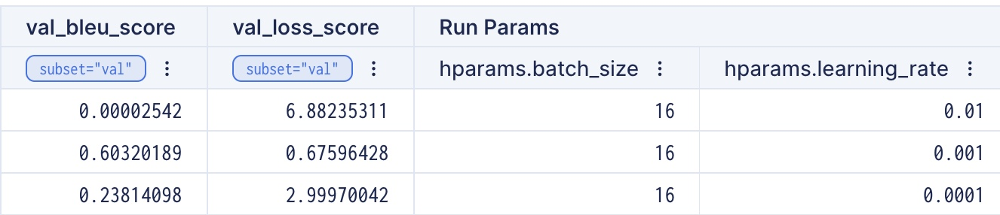


**Batch Size Analysis:**

The batch size also plays a crucial role in determining the model's performance. Smaller batch sizes, such as 8, yield the best results, achieving the highest BLEU score (0.65025095) and the lowest loss (0.58778565) when paired with a learning rate of 0.001. Larger batch sizes, like 16 and 32, also perform well but are slightly outperformed by batch size 8. For instance, with a batch size of 16, the BLEU score drops to 0.60320189, and the loss increases to 0.67596428, while a batch size of 32 further reduces the BLEU score to 0.54750277 and increases the loss to 0.95969722. This indicates that smaller batch sizes generalize better, while larger batch sizes may speed up training but compromise performance.

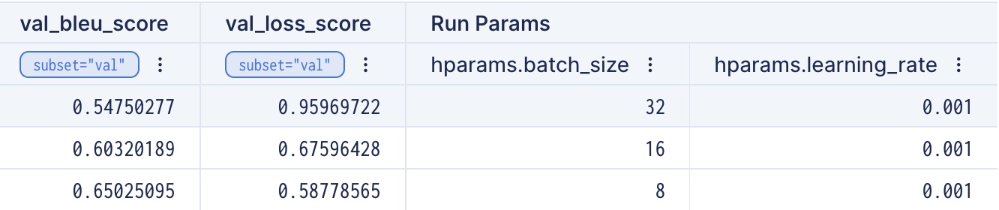